In [228]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"
import torch
import torch
import torch.nn as nn
import torchvision.transforms.functional as TF
import numpy as np
import kagglehub
from torch.utils.data import Dataset, DataLoader
import os
from PIL import Image
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from torch.utils.data import Dataset
from tqdm import tqdm
import os
import glob
import cv2
from PIL import Image
import pandas as pd
from torchmetrics import JaccardIndex


In [128]:
seed = 42
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
device = torch.device("cpu") if not torch.cuda.is_available() else torch.device("cuda:0")
print("Using device", device)
gpu_name = torch.cuda.get_device_name(device)
print(f"GPU Name: {gpu_name}")

Using device cuda:0
GPU Name: NVIDIA GeForce RTX 4090


In [3]:
torch.cuda.empty_cache()

print(torch.cuda.memory_summary())
print(torch.cuda.memory_allocated())
print(torch.cuda.memory_reserved())


|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |      0 B   |      0 B   |      0 B   |      0 B   |
|       from large pool |      0 B   |      0 B   |      0 B   |      0 B   |
|       from small pool |      0 B   |      0 B   |      0 B   |      0 B   |
|---------------------------------------------------------------------------|
| Active memory         |      0 B   |      0 B   |      0 B   |      0 B   |
|       from large pool |      0 B   |      0 B   |      0 B   |

In [4]:
import torch
# model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
from torchvision.models.segmentation import deeplabv3_resnet50

In [7]:
from datasets import load_dataset

# Specify the directory where you want to cache the dataset files
cache_directory = "/media/adminnio/Volume/Data/HuggingFace"

ds = load_dataset("EPFL-ECEO/coralscapes", cache_dir=cache_directory)


In [8]:
ds

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 1517
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 166
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 392
    })
})

In [9]:
from IPython.display import display
imageA_dict = ds['train'][0]['image']
imageB_dict = ds['train'][0]['label']

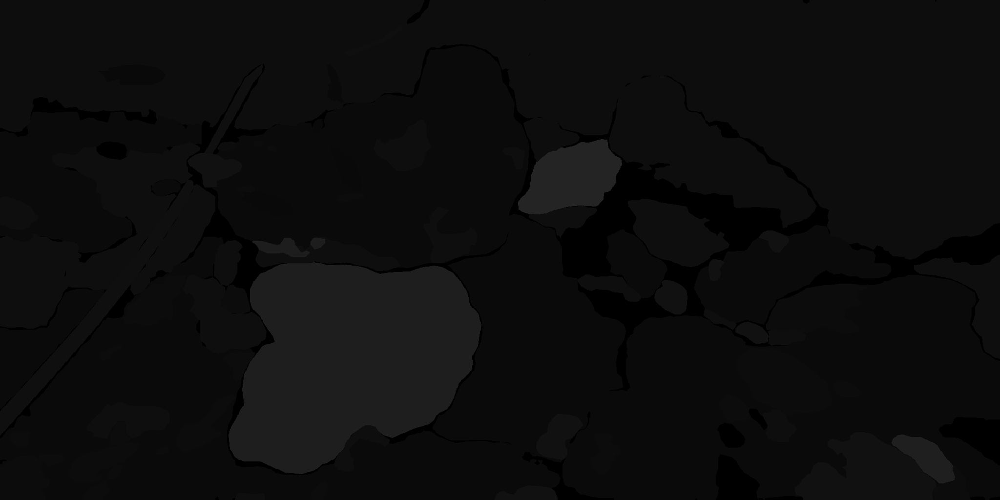

(1024, 2048)


In [10]:
from IPython.display import display
sample = ds['train'][0]
image = sample['image']
mask = sample['label']
display(mask)
print(np.shape(mask))

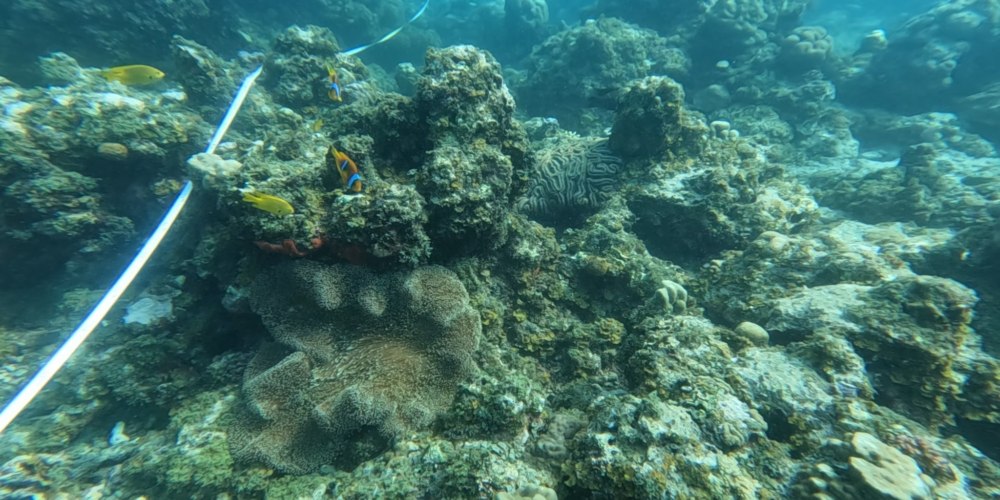

In [11]:
display(image)

In [285]:
from collections import namedtuple

Label = namedtuple('Label', [
    'name',
    'id',
    'trainId',
    'category',
    'categoryId',
    'hasInstances',
    'ignoreInEval',
    'color',
])

# Category mapping (custom, feel free to adjust)
category_map = {
    'coral': 0,
    'animal': 1,
    'substrate': 2,
    'human': 3,
    'object': 4,
    'plant': 5,
    'trash': 6,
    'unknown': 7,
    'void': 8
}

labels = [
    #              name                       id  trainId  category           categoryId  hasInstances  ignoreInEval  color
    Label('unlabeled',                        0,     255,  'void',            category_map['void'],     False,       True,   (255, 255, 255)),
    Label('seagrass',                         1,       0,  'plant',           category_map['plant'],    False,       False,  (125, 222, 125)),
    Label('trash',                            2,       1,  'trash',           category_map['trash'],    False,       False,  (255, 0, 134)),
    Label('other coral dead',                 3,       2,  'coral',           category_map['coral'],    False,       False,  (114, 60, 61)),
    Label('other coral bleached',             4,       3,  'coral',           category_map['coral'],    False,       False,  (250, 224, 225)),
    Label('sand',                             5,       4,  'substrate',       category_map['substrate'],False,       False,  (194, 178, 128)),
    Label('other coral alive',                6,       5,  'coral',           category_map['coral'],    False,       False,  (224, 118, 119)),
    Label('human',                            7,       6,  'human',           category_map['human'],    True,        False,  (255, 0, 0)),
    Label('transect tools',                   8,       7,  'object',          category_map['object'],   False,       False,  (8, 205, 12)),
    Label('fish',                             9,       8,  'animal',          category_map['animal'],   True,        False,  (255, 255, 0)),
    Label('algae covered substrate',         10,       9,  'substrate',       category_map['substrate'],False,       False,  (125, 163, 125)),
    Label('other animal',                    11,      10,  'animal',          category_map['animal'],   False,       False,  (0, 255, 255)),
    Label('unknown hard substrate',          12,      11,  'unknown',         category_map['unknown'],  False,       False,  (125, 125, 125)),
    Label('background',                      13,      255, 'void',            category_map['void'],     False,       True,   (29, 162, 216)),
    Label('dark',                            14,      255, 'void',            category_map['void'],     False,       True,   (31, 31, 31)),
    Label('transect line',                   15,      12,  'object',          category_map['object'],   False,       False,  (0, 255, 0)),
    Label('massive/meandering bleached',     16,      13,  'coral',           category_map['coral'],    False,       False,  (255, 248, 228)),
    Label('massive/meandering alive',        17,      14,  'coral',           category_map['coral'],    False,       False,  (236, 150, 21)),
    Label('rubble',                          18,      15,  'substrate',       category_map['substrate'],False,       False,  (161, 153, 128)),
    Label('branching bleached',             19,      16,  'coral',           category_map['coral'],    False,       False,  (252, 231, 240)),
    Label('branching dead',                 20,      17,  'coral',           category_map['coral'],    False,       False,  (123, 50, 86)),
    Label('millepora',                       21,      18,  'coral',           category_map['coral'],    False,       False,  (244, 150, 115)),
    Label('branching alive',                22,      19,  'coral',           category_map['coral'],    False,       False,  (226, 91, 157)),
    Label('massive/meandering dead',        23,      20,  'coral',           category_map['coral'],    False,       False,  (134, 86, 18)),
    Label('clam',                            24,      21,  'animal',          category_map['animal'],   False,       False,  (189, 255, 234)),
    Label('acropora alive',                  25,      22,  'coral',           category_map['coral'],    False,       False,  (236, 128, 255)),
    Label('sea cucumber',                    26,      23,  'animal',          category_map['animal'],   False,       False,  (0, 231, 255)),
    Label('turbinaria',                      27,      24,  'coral',           category_map['coral'],    False,       False,  (228, 255, 119)),
    Label('table acropora alive',            28,      25,  'coral',           category_map['coral'],    False,       False,  (189, 119, 255)),
    Label('sponge',                          29,      26,  'animal',          category_map['animal'],   False,       False,  (240, 80, 80)),
    Label('anemone',                         30,      27,  'animal',          category_map['animal'],   False,       False,  (0, 255, 189)),
    Label('pocillopora alive',              31,      28,  'coral',           category_map['coral'],    False,       False,  (255, 146, 150)),
    Label('table acropora dead',            32,      29,  'coral',           category_map['coral'],    False,       False,  (85, 53, 116)),
    Label('meandering bleached',            33,      30,  'coral',           category_map['coral'],    False,       False,  (251, 243, 216)),
    Label('stylophora alive',               34,      31,  'coral',           category_map['coral'],    False,       False,  (255, 111, 194)),
    Label('sea urchin',                      35,      32,  'animal',          category_map['animal'],   False,       False,  (0, 142, 255)),
    Label('meandering alive',               36,      33,  'coral',           category_map['coral'],    False,       False,  (230, 193, 0)),
    Label('meandering dead',                37,      34,  'coral',           category_map['coral'],    False,       False,  (119, 100, 14)),
    Label('crown of thorn',                 38,      35,  'animal',          category_map['animal'],   False,       False,  (179, 245, 234)),
    Label('dead clam',                       39,      36,  'animal',          category_map['animal'],   False,       False,  (89, 155, 134)),
]


In [140]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Works on PIL Image
    transforms.ToTensor(),          # Converts to tensor after resizing
])

In [240]:
# class Cityscape(Dataset):
#     def __init__(self, dcit, transform=transform, label_map='categoryId',operation='train'):
#         self.transform = transform
#         self.ds = dcit
#         self.label_map = label_map
#         self.dataset_ops = operation
#         self.id_2_train = {}
#         self.id_2_cat = {}
#         self.trainid_2_name = {}
#         self.train_2_id = {}
#         self.id_2_name = {}

#         for lbl in labels:
#             self.id_2_train[lbl.id] = 0 if lbl.ignoreInEval else lbl.trainId
#             self.id_2_cat[lbl.id] = lbl.categoryId
#             if not lbl.ignoreInEval:
#                 self.trainid_2_name[lbl.trainId] = lbl.name
#                 self.train_2_id[lbl.trainId] = lbl.id
#             self.id_2_name[lbl.id] = lbl.name

#     def __getitem__(self, idx):
#         sample = self.ds[self.dataset_ops][idx]
#         img = sample['image']
#         mask = np.array(sample['label']).astype(np.float32)

#         if self.label_map == 'id':
#             mask[mask == -1] = 0  # Default ignore
#         elif self.label_map == 'trainId':
#             mapped_mask = np.zeros_like(mask, dtype=np.uint8)
#             for _id, train_id in self.id_2_train.items():
#                 mapped_mask[mask == _id] = train_id
#             mask = mapped_mask
#         elif self.label_map == 'categoryId':
#             mapped_mask = np.zeros_like(mask, dtype=np.uint8)
#             for _id, cat_id in self.id_2_cat.items():
#                 mapped_mask[mask == _id] = cat_id
#             mask = mapped_mask
#         mask = Image.fromarray(mask)
#         mask = mask.resize((256, 256), resample=Image.NEAREST)
#         mask = torch.from_numpy(np.array(mask)).long()  # convert back to tensor
#         # Apply transforms
#         if self.transform:
#             img = self.transform(img) # Apply transform to image and update img

#         return img, mask

#     def __len__(self):
#         return len(self.ds[self.dataset_ops]) # Corrected to use self.dataset_ops
class Cityscape(Dataset):
    def __init__(self, dcit, transform=transform, label_map='categoryId', operation='train'):
        self.transform = transform
        self.ds = dcit
        self.label_map = label_map
        self.dataset_ops = operation
        self.id_2_train = {}
        self.id_2_cat = {}
        self.trainid_2_name = {}
        self.train_2_id = {}
        self.id_2_name = {}
        
        # Add category mappings for verification
        self.categoryid_2_name = {}
        
        for lbl in labels:
            self.id_2_train[lbl.id] = 0 if lbl.ignoreInEval else lbl.trainId
            self.id_2_cat[lbl.id] = lbl.categoryId
            if not lbl.ignoreInEval:
                self.trainid_2_name[lbl.trainId] = lbl.name
                self.train_2_id[lbl.trainId] = lbl.id
            self.id_2_name[lbl.id] = lbl.name
            
            # Build category ID to name mapping
            if lbl.categoryId not in self.categoryid_2_name:
                self.categoryid_2_name[lbl.categoryId] = lbl.category
    
    def get_category_info(self):
        """Helper method to get category information"""
        return {
            'categoryid_2_name': self.categoryid_2_name,
            'num_categories': len(self.categoryid_2_name),
            'category_ids': list(self.categoryid_2_name.keys())
        }
    
    def __getitem__(self, idx):
        sample = self.ds[self.dataset_ops][idx]
        img = sample['image']
        mask = np.array(sample['label']).astype(np.float32)

        if self.label_map == 'id':
            mask[mask == -1] = 0  # Default ignore
        elif self.label_map == 'trainId':
            mapped_mask = np.zeros_like(mask, dtype=np.uint8)
            for _id, train_id in self.id_2_train.items():
                mapped_mask[mask == _id] = train_id
            mask = mapped_mask
        elif self.label_map == 'categoryId':
            mapped_mask = np.zeros_like(mask, dtype=np.uint8)
            for _id, cat_id in self.id_2_cat.items():
                mapped_mask[mask == _id] = cat_id
            mask = mapped_mask

        mask = Image.fromarray(mask)
        mask = mask.resize((256, 256), resample=Image.NEAREST)
        mask = torch.from_numpy(np.array(mask)).long()

        if self.transform:
            img = self.transform(img)

        return img, mask

    def __len__(self):
        return len(self.ds[self.dataset_ops])

In [207]:
dataset = Cityscape(ds,  transform=transform,operation='train',label_map='categoryId')
category_info = dataset.get_category_info()
print("Category Info:", category_info)


Category Info: {'categoryid_2_name': {8: 'void', 5: 'plant', 6: 'trash', 0: 'coral', 2: 'substrate', 3: 'human', 4: 'object', 1: 'animal', 7: 'unknown'}, 'num_categories': 9, 'category_ids': [8, 5, 6, 0, 2, 3, 4, 1, 7]}


In [243]:
dataset = Cityscape(ds,  transform=transform,operation='train')
data_loader = DataLoader(dataset, batch_size=32, shuffle=True,drop_last=True )

In [209]:
# Quick verification script - run this after creating your dataset
dataset = Cityscape(ds, label_map='categoryId')

print("=== DATASET CLASS VERIFICATION ===")

# 1. Quick check of first few samples
print("1. Checking first 5 samples:")
for i in range(5):
    img, mask = dataset[i]
    unique_classes = torch.unique(mask)
    print(f"   Sample {i}: classes {unique_classes.tolist()}, range [{torch.min(mask)}-{torch.max(mask)}]")

# 2. Check expected vs actual categories
expected_categories = list(range(9))  # Should be 0-8 (9 categories total)
print(f"\n2. Expected categories: {expected_categories}")

=== DATASET CLASS VERIFICATION ===
1. Checking first 5 samples:
   Sample 0: classes [0, 1, 2, 4, 7, 8], range [0-8]
   Sample 1: classes [0, 1, 2, 4, 7, 8], range [0-8]
   Sample 2: classes [0, 1, 2, 4, 7, 8], range [0-8]
   Sample 3: classes [0, 1, 2, 4, 7, 8], range [0-8]
   Sample 4: classes [0, 1, 2, 7, 8], range [0-8]

2. Expected categories: [0, 1, 2, 3, 4, 5, 6, 7, 8]


In [210]:
try:
    images, masks = next(iter(data_loader))

    print(f"Shape of images in the first batch: {images.shape}")
    print(f"Shape of masks in the first batch: {masks.shape}")
    if images.shape[0] == 4:
        print("Success: The first batch contains 4 images.")
    else:
        print(f"Warning: The first batch contains {images.shape[0]} images, not 4.")
        print("This could happen if drop_last=True was not used and the dataset size is small.")

except StopIteration:
    print("Error: The DataLoader is empty. This can happen if the dataset is too small for the batch size and drop_last=True.")
    print(f"Dataset length: {len(dataset)}")

Shape of images in the first batch: torch.Size([32, 3, 256, 256])
Shape of masks in the first batch: torch.Size([32, 256, 256])
This could happen if drop_last=True was not used and the dataset size is small.


In [197]:
for batch_idx, (images, masks) in enumerate(tqdm(data_loader, desc="Checking batches")):
    current_batch_size = images.shape[0]
    if current_batch_size != 4:
        print(f"\nIssue found in batch {batch_idx}: Expected 32 images, got {current_batch_size} images.")
        break
    else:
        if batch_idx < 3: 
            print(f"Batch {batch_idx} images shape: {images.shape}")
            print(f"Batch {batch_idx} masks shape: {masks.shape}")

print("\nVerification complete. All batches (if drop_last=True) should be 32 images, or the last batch will be smaller if drop_last=False.")


Checking batches:   0%|                                  | 0/47 [00:01<?, ?it/s]


Issue found in batch 0: Expected 32 images, got 32 images.

Verification complete. All batches (if drop_last=True) should be 32 images, or the last batch will be smaller if drop_last=False.


In [211]:
img,label = next(iter(data_loader))
img_np = img[0].cpu().numpy() 
print(np.shape(img))

torch.Size([32, 3, 256, 256])


torch.Size([32, 256, 256])


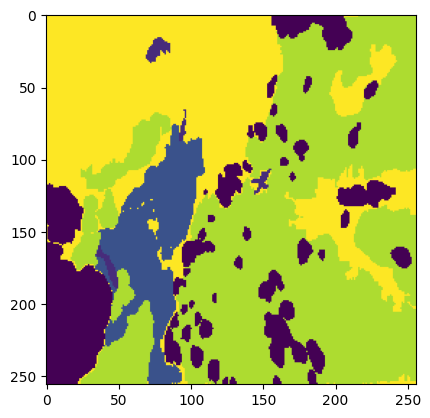

In [212]:
img_np = img[3].cpu().numpy() 
print(np.shape(label))
img_np = img[0].cpu().numpy()
np.shape(label[1])
label_np = label[1].cpu().numpy() 
plt.imshow(label_np)
img_np = np.transpose(img_np, (1, 2, 0))



In [213]:
# print("First 5 ID to TrainID mappings:", list(dataset.id_2_train.items())[:40])
# print("TrainID to Name:", dataset.trainid_2_name)
# !export PYTORCH_CUDA_ALLOC_CONF=max_split_size_mb:128

In [292]:
# !export PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True
# import os
# os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"
# !export PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True
# import torch
# import gc
# gc.collect()
# torch.cuda.empty_cache()
# print(torch.cuda.memory_summary())

In [215]:
dir_path = "/media/adminnio/Volume/Data/Datasets/Corals/models/weights"
model_name = "deeplabv3_resnet50_coral_segmentation" # A descriptive name for your model
model_save_dir = os.path.join(dir_path, model_name)
os.makedirs(model_save_dir, exist_ok=True) # Create the directory if it doesn't exist
log_file_path = os.path.join(model_save_dir, f"{model_name}_training_log.csv")
log_data = [] # To store loss and IoU for each epoch

best_iou = -1.0 # Initialize best IoU for saving the best model


In [216]:
def calculate_iou(outputs, masks, num_classes):
    # outputs: (N, C, H, W) - raw model outputs
    # masks: (N, H, W) - ground truth masks
    preds = torch.argmax(outputs, dim=1) # Get predicted class for each pixel

    iou_per_class = []
    for cls in range(num_classes):
        true_positive = ((preds == cls) & (masks == cls)).sum().item()
        false_positive = ((preds == cls) & (masks != cls)).sum().item()
        false_negative = ((preds != cls) & (masks == cls)).sum().item()

        denominator = true_positive + false_positive + false_negative
        if denominator == 0:
            iou_per_class.append(np.nan) # Avoid division by zero
        else:
            iou_per_class.append(true_positive / denominator)

    # Filter out NaN values (classes not present in current batch)
    valid_ious = [iou for iou in iou_per_class if not np.isnan(iou)]
    if len(valid_ious) == 0:
        return 0.0 # No valid classes to compute IoU
    return np.mean(valid_ious)

In [218]:
!export PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True

torch.cuda.empty_cache()
model = deeplabv3_resnet50(pretrained=True)
model = deeplabv3_resnet50(pretrained=True)
model.classifier[4] = torch.nn.Conv2d(256, 9, 1)
# for param in model.backbone.parameters(): #fREEZE BACKBONE
#     param.requires_grad = False
model.to(device)
epochs=200
verbose =1
criterion = nn.CrossEntropyLoss(ignore_index=-1)  # Ignore unlabeled pixels if you use -1`
optimizer = optim.Adam(model.parameters(), lr=1e-5)
model.train()
for epoch in range(epochs):
    running_loss = 0.0
    running_iou = 0.0
    total_batches = len(data_loader)

    print(f"\nEpoch {epoch+1}/{epochs}")
    print("-" * 30)

    progress_bar = tqdm(enumerate(data_loader), total=total_batches, leave=False)
    for batch_idx, (images, masks) in progress_bar:
        images = images.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)

        loss = criterion(outputs['out'], masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

         
        batch_iou = calculate_iou(outputs['out'], masks, num_classes=9)
        running_iou += batch_iou


        avg_loss = running_loss / (batch_idx + 1)
        avg_iou = running_iou / (batch_idx + 1)

        progress_bar.set_description(f"Batch {batch_idx+1}/{total_batches}")
        progress_bar.set_postfix(loss=f"{avg_loss:.4f}", iou=f"{avg_iou:.4f}")

    epoch_loss = running_loss / total_batches
    epoch_iou = running_iou / total_batches
    print(f"Epoch {epoch+1} finished. Average Loss: {epoch_loss:.4f}, Average IoU: {epoch_iou:.4f}")

    if (epoch % 10 == 0):
        checkpoint_path = os.path.join(model_save_dir, f"{model_name}_epoch_{epoch+1}.pth")
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': epoch_loss,
            'iou': epoch_iou,
        }, checkpoint_path)
        print(f"Checkpoint saved to {checkpoint_path}")

    
    if epoch_iou > best_iou:
        best_iou = epoch_iou
        best_model_path = os.path.join(model_save_dir, f"{model_name}_best_iou.pth")
        torch.save(model.state_dict(), best_model_path)
        print(f"New best model saved to {best_model_path} with IoU: {best_iou:.4f}")

     
    log_data.append({
        'epoch': epoch + 1,
        'loss': epoch_loss,
        'iou': epoch_iou
    })
    pd.DataFrame(log_data).to_csv(log_file_path, index=False)
    print(f"Training log updated at {log_file_path}")

print("\nTraining complete!")


Epoch 1/200
------------------------------


Epoch 1 finished. Average Loss: 2.0781, Average IoU: 0.0884
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_1.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 2/200
------------------------------


Epoch 2 finished. Average Loss: 1.8263, Average IoU: 0.1737
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 3/200
------------------------------


Epoch 3 finished. Average Loss: 1.6293, Average IoU: 0.2202
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.2202
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 4/200
------------------------------


Epoch 4 finished. Average Loss: 1.4789, Average IoU: 0.2362
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.2362
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 5/200
------------------------------


Epoch 5 finished. Average Loss: 1.3654, Average IoU: 0.2736
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.2736
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 6/200
------------------------------


Epoch 6 finished. Average Loss: 1.2818, Average IoU: 0.2944
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.2944
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 7/200
------------------------------


Epoch 7 finished. Average Loss: 1.2117, Average IoU: 0.3107
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.3107
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 8/200
------------------------------


Epoch 8 finished. Average Loss: 1.1509, Average IoU: 0.3475
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.3475
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 9/200
------------------------------


Epoch 9 finished. Average Loss: 1.1012, Average IoU: 0.3531
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.3531
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 10/200
------------------------------


Epoch 10 finished. Average Loss: 1.0600, Average IoU: 0.3757
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.3757
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 11/200
------------------------------


Epoch 11 finished. Average Loss: 1.0212, Average IoU: 0.3828
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_11.pth
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.3828
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 12/200
------------------------------


Epoch 12 finished. Average Loss: 0.9861, Average IoU: 0.3920
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.3920
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 13/200
------------------------------


Epoch 13 finished. Average Loss: 0.9573, Average IoU: 0.3959
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.3959
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 14/200
------------------------------


Epoch 14 finished. Average Loss: 0.9235, Average IoU: 0.4143
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4143
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 15/200
------------------------------


Epoch 15 finished. Average Loss: 0.8951, Average IoU: 0.4142
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 16/200
------------------------------


Epoch 16 finished. Average Loss: 0.8702, Average IoU: 0.4120
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 17/200
------------------------------


Epoch 17 finished. Average Loss: 0.8455, Average IoU: 0.4313
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4313
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 18/200
------------------------------


Epoch 18 finished. Average Loss: 0.8229, Average IoU: 0.4325
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4325
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 19/200
------------------------------


Epoch 19 finished. Average Loss: 0.8052, Average IoU: 0.4287
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 20/200
------------------------------


Epoch 20 finished. Average Loss: 0.7870, Average IoU: 0.4441
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4441
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 21/200
------------------------------


Epoch 21 finished. Average Loss: 0.7659, Average IoU: 0.4380
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_21.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 22/200
------------------------------


Epoch 22 finished. Average Loss: 0.7463, Average IoU: 0.4463
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4463
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 23/200
------------------------------


Epoch 23 finished. Average Loss: 0.7309, Average IoU: 0.4451
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 24/200
------------------------------


Epoch 24 finished. Average Loss: 0.7189, Average IoU: 0.4539
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4539
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 25/200
------------------------------


Epoch 25 finished. Average Loss: 0.7008, Average IoU: 0.4593
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4593
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 26/200
------------------------------


Epoch 26 finished. Average Loss: 0.6875, Average IoU: 0.4508
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 27/200
------------------------------


Epoch 27 finished. Average Loss: 0.6708, Average IoU: 0.4607
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4607
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 28/200
------------------------------


Epoch 28 finished. Average Loss: 0.6593, Average IoU: 0.4632
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4632
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 29/200
------------------------------


Epoch 29 finished. Average Loss: 0.6446, Average IoU: 0.4709
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4709
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 30/200
------------------------------


Epoch 30 finished. Average Loss: 0.6343, Average IoU: 0.4751
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4751
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 31/200
------------------------------


Epoch 31 finished. Average Loss: 0.6212, Average IoU: 0.4681
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_31.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 32/200
------------------------------


Epoch 32 finished. Average Loss: 0.6096, Average IoU: 0.4640
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 33/200
------------------------------


Epoch 33 finished. Average Loss: 0.6015, Average IoU: 0.4817
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4817
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 34/200
------------------------------


Epoch 34 finished. Average Loss: 0.5855, Average IoU: 0.4800
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 35/200
------------------------------


Epoch 35 finished. Average Loss: 0.5740, Average IoU: 0.4854
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4854
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 36/200
------------------------------


Epoch 36 finished. Average Loss: 0.5660, Average IoU: 0.4819
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 37/200
------------------------------


Epoch 37 finished. Average Loss: 0.5590, Average IoU: 0.4845
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 38/200
------------------------------


Epoch 38 finished. Average Loss: 0.5476, Average IoU: 0.4991
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.4991
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 39/200
------------------------------


Epoch 39 finished. Average Loss: 0.5411, Average IoU: 0.4951
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 40/200
------------------------------


Epoch 40 finished. Average Loss: 0.5327, Average IoU: 0.5021
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5021
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 41/200
------------------------------


Epoch 41 finished. Average Loss: 0.5227, Average IoU: 0.4957
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_41.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 42/200
------------------------------


Epoch 42 finished. Average Loss: 0.5120, Average IoU: 0.4985
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 43/200
------------------------------


Epoch 43 finished. Average Loss: 0.5082, Average IoU: 0.5043
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5043
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 44/200
------------------------------


Epoch 44 finished. Average Loss: 0.4958, Average IoU: 0.5064
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5064
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 45/200
------------------------------


Epoch 45 finished. Average Loss: 0.4891, Average IoU: 0.5047
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 46/200
------------------------------


Epoch 46 finished. Average Loss: 0.4852, Average IoU: 0.5193
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5193
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 47/200
------------------------------


Epoch 47 finished. Average Loss: 0.4753, Average IoU: 0.5151
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 48/200
------------------------------


Epoch 48 finished. Average Loss: 0.4750, Average IoU: 0.5070
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 49/200
------------------------------


Epoch 49 finished. Average Loss: 0.4626, Average IoU: 0.5138
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 50/200
------------------------------


Epoch 50 finished. Average Loss: 0.4558, Average IoU: 0.5190
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 51/200
------------------------------


Epoch 51 finished. Average Loss: 0.4513, Average IoU: 0.5088
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_51.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 52/200
------------------------------


Epoch 52 finished. Average Loss: 0.4438, Average IoU: 0.5156
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 53/200
------------------------------


Epoch 53 finished. Average Loss: 0.4388, Average IoU: 0.5210
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5210
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 54/200
------------------------------


Epoch 54 finished. Average Loss: 0.4371, Average IoU: 0.5168
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 55/200
------------------------------


Epoch 55 finished. Average Loss: 0.4298, Average IoU: 0.5256
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5256
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 56/200
------------------------------


Epoch 56 finished. Average Loss: 0.4233, Average IoU: 0.5229
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 57/200
------------------------------


Epoch 57 finished. Average Loss: 0.4231, Average IoU: 0.5356
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5356
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 58/200
------------------------------


Epoch 58 finished. Average Loss: 0.4138, Average IoU: 0.5306
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 59/200
------------------------------


Epoch 59 finished. Average Loss: 0.4067, Average IoU: 0.5345
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 60/200
------------------------------


Epoch 60 finished. Average Loss: 0.4067, Average IoU: 0.5458
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5458
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 61/200
------------------------------


Epoch 61 finished. Average Loss: 0.4026, Average IoU: 0.5355
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_61.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 62/200
------------------------------


Epoch 62 finished. Average Loss: 0.3973, Average IoU: 0.5564
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5564
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 63/200
------------------------------


Epoch 63 finished. Average Loss: 0.3900, Average IoU: 0.5615
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5615
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 64/200
------------------------------


Epoch 64 finished. Average Loss: 0.3850, Average IoU: 0.5617
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5617
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 65/200
------------------------------


Epoch 65 finished. Average Loss: 0.3800, Average IoU: 0.5571
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 66/200
------------------------------


Epoch 66 finished. Average Loss: 0.3784, Average IoU: 0.5634
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5634
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 67/200
------------------------------


Epoch 67 finished. Average Loss: 0.3749, Average IoU: 0.5615
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 68/200
------------------------------


Epoch 68 finished. Average Loss: 0.3751, Average IoU: 0.5706
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5706
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 69/200
------------------------------


Epoch 69 finished. Average Loss: 0.3678, Average IoU: 0.5680
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 70/200
------------------------------


Epoch 70 finished. Average Loss: 0.3619, Average IoU: 0.5683
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 71/200
------------------------------


Epoch 71 finished. Average Loss: 0.3578, Average IoU: 0.5781
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_71.pth
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5781
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 72/200
------------------------------


Epoch 72 finished. Average Loss: 0.3583, Average IoU: 0.5854
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5854
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 73/200
------------------------------


Epoch 73 finished. Average Loss: 0.3483, Average IoU: 0.5819
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 74/200
------------------------------


Epoch 74 finished. Average Loss: 0.3501, Average IoU: 0.5778
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 75/200
------------------------------


Epoch 75 finished. Average Loss: 0.3440, Average IoU: 0.5914
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5914
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 76/200
------------------------------


Epoch 76 finished. Average Loss: 0.3408, Average IoU: 0.5908
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 77/200
------------------------------


Epoch 77 finished. Average Loss: 0.3379, Average IoU: 0.5954
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.5954
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 78/200
------------------------------


Epoch 78 finished. Average Loss: 0.3390, Average IoU: 0.5948
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 79/200
------------------------------


Epoch 79 finished. Average Loss: 0.3340, Average IoU: 0.5871
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 80/200
------------------------------


Epoch 80 finished. Average Loss: 0.3328, Average IoU: 0.5934
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 81/200
------------------------------


Epoch 81 finished. Average Loss: 0.3255, Average IoU: 0.5935
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_81.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 82/200
------------------------------


Epoch 82 finished. Average Loss: 0.3211, Average IoU: 0.6090
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6090
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 83/200
------------------------------


Epoch 83 finished. Average Loss: 0.3216, Average IoU: 0.6058
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 84/200
------------------------------


Epoch 84 finished. Average Loss: 0.3222, Average IoU: 0.6038
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 85/200
------------------------------


Epoch 85 finished. Average Loss: 0.3143, Average IoU: 0.6166
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6166
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 86/200
------------------------------


Epoch 86 finished. Average Loss: 0.3101, Average IoU: 0.6128
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 87/200
------------------------------


Epoch 87 finished. Average Loss: 0.3133, Average IoU: 0.6086
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 88/200
------------------------------


Epoch 88 finished. Average Loss: 0.3078, Average IoU: 0.6159
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 89/200
------------------------------


Epoch 89 finished. Average Loss: 0.3075, Average IoU: 0.6177
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6177
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 90/200
------------------------------


Epoch 90 finished. Average Loss: 0.3044, Average IoU: 0.6189
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6189
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 91/200
------------------------------


Epoch 91 finished. Average Loss: 0.3006, Average IoU: 0.6131
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_91.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 92/200
------------------------------


Epoch 92 finished. Average Loss: 0.3008, Average IoU: 0.6316
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6316
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 93/200
------------------------------


Epoch 93 finished. Average Loss: 0.2973, Average IoU: 0.6298
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 94/200
------------------------------


Epoch 94 finished. Average Loss: 0.2953, Average IoU: 0.6325
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6325
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 95/200
------------------------------


Epoch 95 finished. Average Loss: 0.2907, Average IoU: 0.6254
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 96/200
------------------------------


Epoch 96 finished. Average Loss: 0.2899, Average IoU: 0.6249
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 97/200
------------------------------


Epoch 97 finished. Average Loss: 0.2894, Average IoU: 0.6305
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 98/200
------------------------------


Epoch 98 finished. Average Loss: 0.2884, Average IoU: 0.6286
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 99/200
------------------------------


Epoch 99 finished. Average Loss: 0.2865, Average IoU: 0.6344
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6344
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 100/200
------------------------------


Epoch 100 finished. Average Loss: 0.2849, Average IoU: 0.6423
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6423
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 101/200
------------------------------


Epoch 101 finished. Average Loss: 0.2806, Average IoU: 0.6394
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_101.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 102/200
------------------------------


Epoch 102 finished. Average Loss: 0.2805, Average IoU: 0.6332
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 103/200
------------------------------


Epoch 103 finished. Average Loss: 0.2780, Average IoU: 0.6383
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 104/200
------------------------------


Epoch 104 finished. Average Loss: 0.2779, Average IoU: 0.6430
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6430
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 105/200
------------------------------


Epoch 105 finished. Average Loss: 0.2741, Average IoU: 0.6404
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 106/200
------------------------------


Epoch 106 finished. Average Loss: 0.2723, Average IoU: 0.6312
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 107/200
------------------------------


Epoch 107 finished. Average Loss: 0.2690, Average IoU: 0.6436
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6436
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 108/200
------------------------------


Epoch 108 finished. Average Loss: 0.2654, Average IoU: 0.6497
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6497
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 109/200
------------------------------


Epoch 109 finished. Average Loss: 0.2675, Average IoU: 0.6492
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 110/200
------------------------------


Epoch 110 finished. Average Loss: 0.2648, Average IoU: 0.6525
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6525
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 111/200
------------------------------


Epoch 111 finished. Average Loss: 0.2633, Average IoU: 0.6497
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_111.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 112/200
------------------------------


Epoch 112 finished. Average Loss: 0.2648, Average IoU: 0.6478
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 113/200
------------------------------


Epoch 113 finished. Average Loss: 0.2620, Average IoU: 0.6513
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 114/200
------------------------------


Epoch 114 finished. Average Loss: 0.2601, Average IoU: 0.6563
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6563
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 115/200
------------------------------


Epoch 115 finished. Average Loss: 0.2599, Average IoU: 0.6540
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 116/200
------------------------------


Epoch 116 finished. Average Loss: 0.2582, Average IoU: 0.6532
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 117/200
------------------------------


Epoch 117 finished. Average Loss: 0.2542, Average IoU: 0.6589
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6589
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 118/200
------------------------------


Epoch 118 finished. Average Loss: 0.2537, Average IoU: 0.6563
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 119/200
------------------------------


Epoch 119 finished. Average Loss: 0.2532, Average IoU: 0.6573
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 120/200
------------------------------


Epoch 120 finished. Average Loss: 0.2529, Average IoU: 0.6595
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6595
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 121/200
------------------------------


Epoch 121 finished. Average Loss: 0.2499, Average IoU: 0.6673
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_121.pth
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6673
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 122/200
------------------------------


Epoch 122 finished. Average Loss: 0.2487, Average IoU: 0.6624
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 123/200
------------------------------


Epoch 123 finished. Average Loss: 0.2455, Average IoU: 0.6709
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6709
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 124/200
------------------------------


Epoch 124 finished. Average Loss: 0.2451, Average IoU: 0.6625
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 125/200
------------------------------


Epoch 125 finished. Average Loss: 0.2437, Average IoU: 0.6703
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 126/200
------------------------------


Epoch 126 finished. Average Loss: 0.2439, Average IoU: 0.6679
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 127/200
------------------------------


Epoch 127 finished. Average Loss: 0.2407, Average IoU: 0.6725
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6725
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 128/200
------------------------------


Epoch 128 finished. Average Loss: 0.2393, Average IoU: 0.6707
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 129/200
------------------------------


Epoch 129 finished. Average Loss: 0.2371, Average IoU: 0.6696
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 130/200
------------------------------


Epoch 130 finished. Average Loss: 0.2379, Average IoU: 0.6689
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 131/200
------------------------------


Epoch 131 finished. Average Loss: 0.2364, Average IoU: 0.6724
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_131.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 132/200
------------------------------


Epoch 132 finished. Average Loss: 0.2364, Average IoU: 0.6746
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6746
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 133/200
------------------------------


Epoch 133 finished. Average Loss: 0.2348, Average IoU: 0.6783
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6783
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 134/200
------------------------------


Epoch 134 finished. Average Loss: 0.2337, Average IoU: 0.6761
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 135/200
------------------------------


Epoch 135 finished. Average Loss: 0.2338, Average IoU: 0.6722
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 136/200
------------------------------


Epoch 136 finished. Average Loss: 0.2309, Average IoU: 0.6845
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6845
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 137/200
------------------------------


Epoch 137 finished. Average Loss: 0.2305, Average IoU: 0.6823
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 138/200
------------------------------


Epoch 138 finished. Average Loss: 0.2277, Average IoU: 0.6910
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6910
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 139/200
------------------------------


Epoch 139 finished. Average Loss: 0.2297, Average IoU: 0.6808
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 140/200
------------------------------


Epoch 140 finished. Average Loss: 0.2288, Average IoU: 0.6831
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 141/200
------------------------------


Epoch 141 finished. Average Loss: 0.2261, Average IoU: 0.6833
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_141.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 142/200
------------------------------


Epoch 142 finished. Average Loss: 0.2261, Average IoU: 0.6805
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 143/200
------------------------------


Epoch 143 finished. Average Loss: 0.2266, Average IoU: 0.6848
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 144/200
------------------------------


Epoch 144 finished. Average Loss: 0.2251, Average IoU: 0.6899
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 145/200
------------------------------


Epoch 145 finished. Average Loss: 0.2206, Average IoU: 0.6854
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 146/200
------------------------------


Epoch 146 finished. Average Loss: 0.2209, Average IoU: 0.6815
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 147/200
------------------------------


Epoch 147 finished. Average Loss: 0.2190, Average IoU: 0.6957
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6957
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 148/200
------------------------------


Epoch 148 finished. Average Loss: 0.2217, Average IoU: 0.6970
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6970
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 149/200
------------------------------


Epoch 149 finished. Average Loss: 0.2191, Average IoU: 0.6923
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 150/200
------------------------------


Epoch 150 finished. Average Loss: 0.2178, Average IoU: 0.6887
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 151/200
------------------------------


Epoch 151 finished. Average Loss: 0.2189, Average IoU: 0.6917
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_151.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 152/200
------------------------------


Epoch 152 finished. Average Loss: 0.2167, Average IoU: 0.6983
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.6983
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 153/200
------------------------------


Epoch 153 finished. Average Loss: 0.2160, Average IoU: 0.6946
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 154/200
------------------------------


Epoch 154 finished. Average Loss: 0.2163, Average IoU: 0.6908
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 155/200
------------------------------


Epoch 155 finished. Average Loss: 0.2135, Average IoU: 0.6936
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 156/200
------------------------------


Epoch 156 finished. Average Loss: 0.2130, Average IoU: 0.6973
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 157/200
------------------------------


Epoch 157 finished. Average Loss: 0.2140, Average IoU: 0.6907
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 158/200
------------------------------


Epoch 158 finished. Average Loss: 0.2120, Average IoU: 0.6917
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 159/200
------------------------------


Epoch 159 finished. Average Loss: 0.2097, Average IoU: 0.6921
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 160/200
------------------------------


Epoch 160 finished. Average Loss: 0.2105, Average IoU: 0.7014
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.7014
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 161/200
------------------------------


Epoch 161 finished. Average Loss: 0.2098, Average IoU: 0.6968
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_161.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 162/200
------------------------------


Epoch 162 finished. Average Loss: 0.2092, Average IoU: 0.7072
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.7072
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 163/200
------------------------------


Epoch 163 finished. Average Loss: 0.2079, Average IoU: 0.7021
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 164/200
------------------------------


Epoch 164 finished. Average Loss: 0.2078, Average IoU: 0.7072
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.7072
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 165/200
------------------------------


Epoch 165 finished. Average Loss: 0.2067, Average IoU: 0.7023
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 166/200
------------------------------


Epoch 166 finished. Average Loss: 0.2086, Average IoU: 0.7058
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 167/200
------------------------------


Epoch 167 finished. Average Loss: 0.2058, Average IoU: 0.6946
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 168/200
------------------------------


Epoch 168 finished. Average Loss: 0.2049, Average IoU: 0.6997
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 169/200
------------------------------


Epoch 169 finished. Average Loss: 0.2043, Average IoU: 0.7096
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.7096
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 170/200
------------------------------


Epoch 170 finished. Average Loss: 0.2044, Average IoU: 0.7082
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 171/200
------------------------------


Epoch 171 finished. Average Loss: 0.2030, Average IoU: 0.7080
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_171.pth
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 172/200
------------------------------


Epoch 172 finished. Average Loss: 0.2012, Average IoU: 0.7062
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 173/200
------------------------------


Epoch 173 finished. Average Loss: 0.2024, Average IoU: 0.7074
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 174/200
------------------------------


Epoch 174 finished. Average Loss: 0.2010, Average IoU: 0.7075
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 175/200
------------------------------


Epoch 175 finished. Average Loss: 0.1982, Average IoU: 0.7095
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 176/200
------------------------------


Epoch 176 finished. Average Loss: 0.1983, Average IoU: 0.7055
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 177/200
------------------------------


Epoch 177 finished. Average Loss: 0.1972, Average IoU: 0.7074
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 178/200
------------------------------


Epoch 178 finished. Average Loss: 0.1975, Average IoU: 0.7072
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 179/200
------------------------------


Epoch 179 finished. Average Loss: 0.1982, Average IoU: 0.7057
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 180/200
------------------------------


Epoch 180 finished. Average Loss: 0.1975, Average IoU: 0.7091
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 181/200
------------------------------


Epoch 181 finished. Average Loss: 0.1953, Average IoU: 0.7205
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_181.pth
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.7205
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 182/200
------------------------------


Epoch 182 finished. Average Loss: 0.1961, Average IoU: 0.7099
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 183/200
------------------------------


Epoch 183 finished. Average Loss: 0.1946, Average IoU: 0.7195
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 184/200
------------------------------


Epoch 184 finished. Average Loss: 0.1944, Average IoU: 0.7208
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.7208
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 185/200
------------------------------


Epoch 185 finished. Average Loss: 0.1948, Average IoU: 0.7131
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 186/200
------------------------------


Epoch 186 finished. Average Loss: 0.1944, Average IoU: 0.7127
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 187/200
------------------------------


Epoch 187 finished. Average Loss: 0.1910, Average IoU: 0.7209
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.7209
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 188/200
------------------------------


Epoch 188 finished. Average Loss: 0.1916, Average IoU: 0.7159
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 189/200
------------------------------


Epoch 189 finished. Average Loss: 0.1937, Average IoU: 0.7196
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 190/200
------------------------------


Epoch 190 finished. Average Loss: 0.1935, Average IoU: 0.7151
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 191/200
------------------------------


Epoch 191 finished. Average Loss: 0.1905, Average IoU: 0.7269
Checkpoint saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_epoch_191.pth
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.7269
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 192/200
------------------------------


Epoch 192 finished. Average Loss: 0.1914, Average IoU: 0.7147
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 193/200
------------------------------


Epoch 193 finished. Average Loss: 0.1912, Average IoU: 0.7091
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 194/200
------------------------------


Epoch 194 finished. Average Loss: 0.1889, Average IoU: 0.7146
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 195/200
------------------------------


Epoch 195 finished. Average Loss: 0.1880, Average IoU: 0.7238
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 196/200
------------------------------


Epoch 196 finished. Average Loss: 0.1875, Average IoU: 0.7239
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 197/200
------------------------------


Epoch 197 finished. Average Loss: 0.1883, Average IoU: 0.7249
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 198/200
------------------------------


Epoch 198 finished. Average Loss: 0.1884, Average IoU: 0.7278
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.7278
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 199/200
------------------------------


Epoch 199 finished. Average Loss: 0.1863, Average IoU: 0.7298
New best model saved to /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_best_iou.pth with IoU: 0.7298
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Epoch 200/200
------------------------------


Epoch 200 finished. Average Loss: 0.1856, Average IoU: 0.7208
Training log updated at /media/adminnio/Volume/Data/Datasets/Corals/models/weights/deeplabv3_resnet50_coral_segmentation/deeplabv3_resnet50_coral_segmentation_training_log.csv

Training complete!


In [220]:
dir_path = "/media/adminnio/Volume/Data/Datasets/Corals/models/weights"
os.makedirs(dir_path, exist_ok=True) 
PATH = os.path.join(dir_path, "model_weights_deeplabv3_resnet50_200epochs.pth")
torch.save(model.state_dict(), PATH)


In [132]:
!ls /media/adminnio/Volume/Data_NerfRaw/Lakshwadeep/data_backup_manikandansir/DCIM/Lagoon/K.L1/Tag_1/G0029465.JPG

/media/adminnio/Volume/Data_NerfRaw/Lakshwadeep/data_backup_manikandansir/DCIM/Lagoon/K.L1/Tag_1/G0029465.JPG


In [293]:
num_classes = 40 
color_map = np.zeros((num_classes, 3), dtype=np.uint8)
for label in labels:
    if label.trainId != 255:
        color_map[label.trainId] = label.color
img_path = "/media/adminnio/Volume/Data_NerfRaw/Lakshwadeep/LAK/1/images/images/G0126856.JPG"
img_pil = Image.open(img_path).convert("RGB")

import torchvision.transforms as T
transform = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor(),
])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()
img_tensor = transform(img_pil).unsqueeze(0).to(device)  # (1, C, H, W)

with torch.no_grad():
    output = model(img_tensor)  # Output shape: [1, num_classes, H, W]

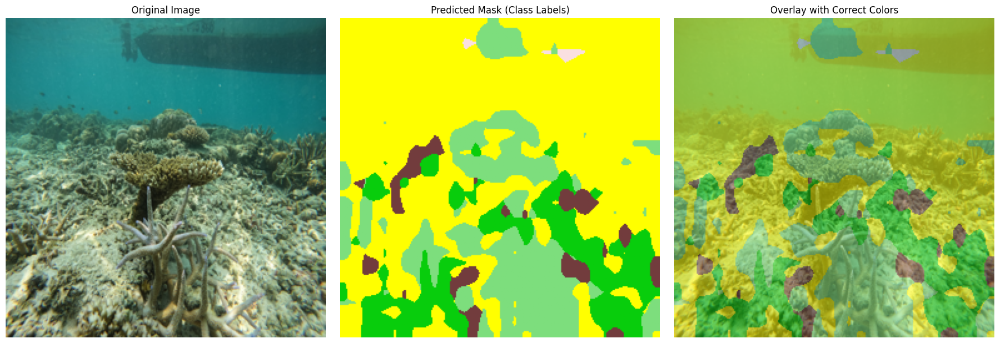

In [298]:



class_map = torch.argmax(output['out'].squeeze(0), dim=0).cpu().numpy()  # (H, W)
color_mask = color_map[class_map]  # (H, W, 3) uint8
color_mask_norm = color_mask.astype(np.float32) / 255.0
img_resized = img_pil.resize((256, 256))
img_np = np.array(img_resized).astype(np.float32) / 255.0
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
axs[0].imshow(img_np)
axs[0].set_title("Original Image")
axs[1].imshow(color_mask_norm,  vmin=0, vmax=num_classes-1)
axs[1].set_title("Predicted Mask (Class Labels)")
axs[2].imshow(img_np)
axs[2].imshow(color_mask_norm, alpha=0.5)
axs[2].set_title("Overlay with Correct Colors")

for ax in axs:
    ax.axis('off')

plt.tight_layout()
plt.show()

In [272]:
# model.to(device)
# model.eval()
# criterion = torch.nn.CrossEntropyLoss(ignore_index=255)  # or your ignore label
# def compute_iou(pred, target, num_classes=9, ignore_index=255):
#     """
#     pred: (N, H, W) predicted labels
#     target: (N, H, W) ground truth labels
#     Returns: IoU for each class, ignoring ignore_index
#     """
#     ious = []
#     pred = pred.view(-1)
#     target = target.view(-1)
    
#     for cls in range(num_classes):
#         if cls == ignore_index:
#             continue
#         pred_inds = pred == cls
#         target_inds = target == cls
#         intersection = (pred_inds & target_inds).sum().item()
#         union = (pred_inds | target_inds).sum().item()
#         if union == 0:
#             ious.append(float('nan'))  # no ground truth for this class in batch
#         else:
#             ious.append(intersection / union)
#     return ious

# losses = []
# miou_list = []

# with torch.no_grad():
#     for images, labels in tqdm(data_loader, desc="Evaluating"):
#         images = images.to(device)
#         labels = labels.to(device)

#         outputs = model(images)  # shape (N, num_classes, H, W)
#         loss = criterion(outputs['out'], labels)

#         losses.append(loss.item())

#         preds = torch.argmax(outputs['out'], dim=1)  # (N, H, W)
#         ious = compute_iou(preds, labels)
#         # mean IoU ignoring NaNs:
#         miou = np.nanmean(ious)
#         miou_list.append(miou)

# # Final metrics
# mean_loss = np.mean(losses)
# mean_miou = np.mean(miou_list)

# print(f"Final Mean Loss: {mean_loss:.4f}")
# print(f"Final Mean IoU: {mean_miou:.4f}")

# plt.figure(figsize=(12,5))



# plt.subplot(1, 2, 2)
# plt.plot(miou_list, label='mIoU', color='green')
# plt.xlabel('Batch')
# plt.ylabel('mIoU')
# plt.title('Mean IoU over batches')
# plt.legend()

# plt.tight_layout()
# plt.show()

In [295]:
train_metrics = {

    'seg_loss' : [],
    'loss': [],
    'IOU' : []
    
}
eval_metrics = {
    'seg_loss': [],
    'loss': [],
    'IOU': [],   
    'IOU_class_mean': [],   
    'IOU_per_class_all': []  
}
num_classes = 9
jaccard = JaccardIndex(task='multiclass', num_classes=num_classes, average=None)
def evaluate_metrics(pred,mask,num_classes):
    preds_net = torch.argmax(pred, dim=1) #[B, C, H, W]  →  [B, H, W]
    per_class_iou = jaccard(preds_net.detach().cpu(), mask.detach().cpu())  # [num_classes] return IOU per class
    mean_iou = per_class_iou.mean().item()
    eval_metrics['IOU'].append(mean_iou)
    eval_metrics['IOU_class_mean'].append(mean_iou)
    eval_metrics['IOU_per_class_all'].append(per_class_iou.tolist())   
    for c in range(num_classes):
            eval_metrics[f"IOU_class_{c}"].append(per_class_iou[c].item())
# import torchvision.transforms as T
transform = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor(),
])

val_dataset = Cityscape(ds,  transform=transform,operation='validation')
val_data_loader = DataLoader(val_dataset, batch_size=32, shuffle=True, drop_last=True)
 
for c in range(num_classes):
    eval_metrics[f"IOU_class_{c}"] = []
model.eval()
with torch.no_grad():
    for images, labels in tqdm(val_data_loader, desc="train"):
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)  # shape (N, C, H, W)
        loss = criterion(outputs['out'], labels)
        eval_metrics['loss'].append(loss.item())
        evaluate_metrics(outputs['out'],labels,num_classes)
        
  


train: 100%|██████████████████████████████████████| 5/5 [00:09<00:00,  1.89s/it]


Debug: Checking eval_metrics lengths:
  seg_loss: 0
  loss: 5
  IOU: 5
  IOU_class_mean: 5
  IOU_per_class_all: 5
  IOU_class_0: 5
  IOU_class_1: 5
  IOU_class_2: 5
  IOU_class_3: 5
  IOU_class_4: 5
  IOU_class_5: 5
  IOU_class_6: 5
  IOU_class_7: 5
  IOU_class_8: 5


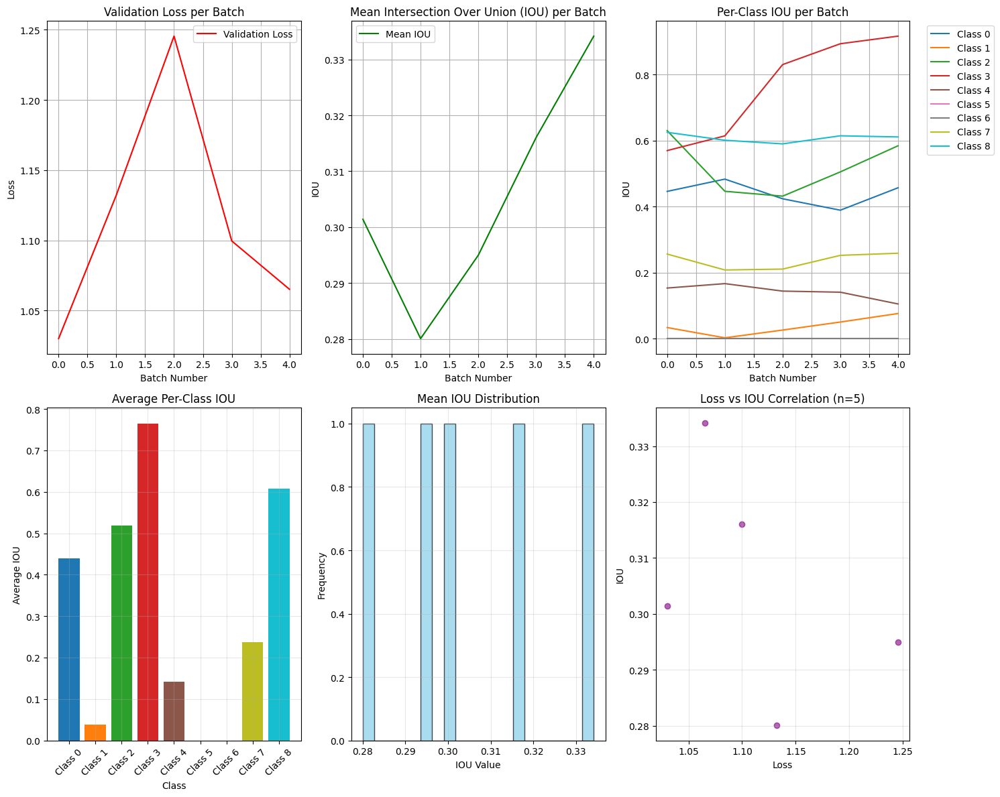


--- Summary Statistics ---
Average Loss: 1.1145 ± 0.0738
Average Mean IOU: 0.3053 ± 0.0185
Best Mean IOU: 0.3342
Worst Mean IOU: 0.2801

Per-Class Average IOUs:
  Class 0: 0.4396 ± 0.0318
  Class 1: 0.0376 ± 0.0246
  Class 2: 0.5193 ± 0.0771
  Class 3: 0.7646 ± 0.1446
  Class 4: 0.1418 ± 0.0205
  Class 5: 0.0000 ± 0.0000
  Class 6: 0.0000 ± 0.0000
  Class 7: 0.2370 ± 0.0229
  Class 8: 0.6081 ± 0.0119


/tmp/ipykernel_13499/3306146682.py:224: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


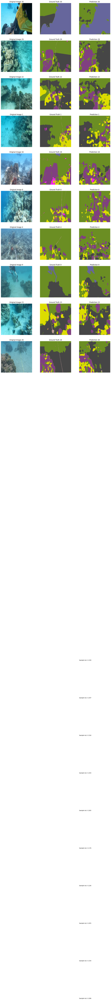

/tmp/ipykernel_13499/3306146682.py:308: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(class_ious_data, labels=class_names)


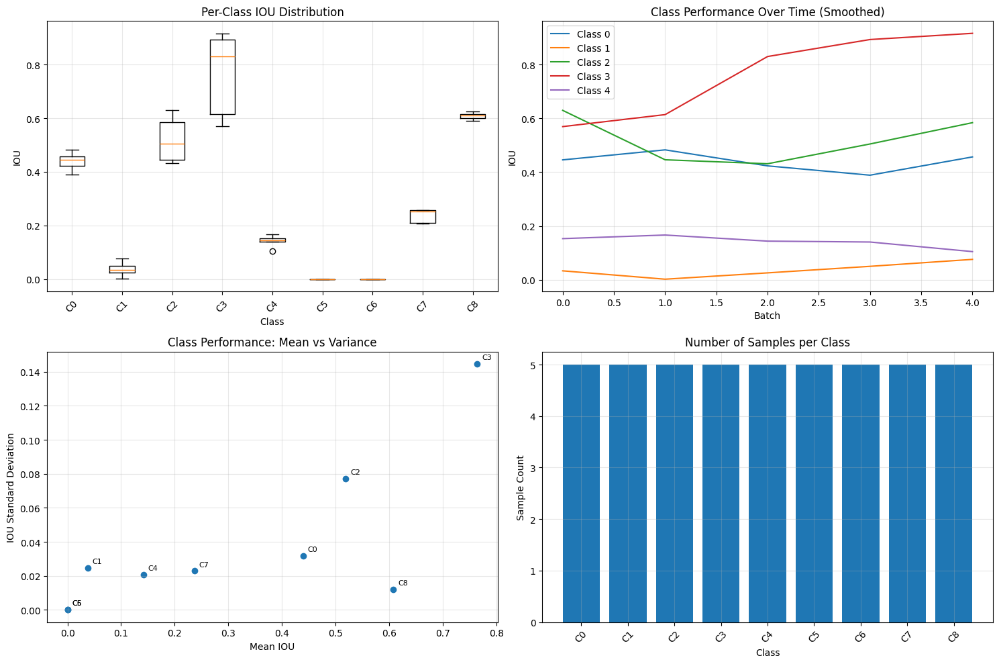

In [297]:
 import matplotlib.pyplot as plt
import numpy as np
import torch
import random
from matplotlib.colors import ListedColormap

# 1. METRICS PLOTTING
def plot_metrics(eval_metrics):
    """Plot all evaluation metrics"""
    
    # Debug: Print lengths to identify the issue
    print("Debug: Checking eval_metrics lengths:")
    for key, value in eval_metrics.items():
        if isinstance(value, list):
            print(f"  {key}: {len(value)}")
    
    # 1.1 Loss Plot
    plt.figure(figsize=(15, 12))
    
    # Loss
    plt.subplot(2, 3, 1)
    if eval_metrics['loss']:
        plt.plot(eval_metrics['loss'], label='Validation Loss', color='red')
        plt.title('Validation Loss per Batch')
        plt.xlabel('Batch Number')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
    else:
        plt.text(0.5, 0.5, 'No loss data available', ha='center', va='center')
        plt.title('Validation Loss per Batch')
    
    # Mean IOU
    plt.subplot(2, 3, 2)
    if eval_metrics['IOU']:
        plt.plot(eval_metrics['IOU'], label='Mean IOU', color='green')
        plt.title('Mean Intersection Over Union (IOU) per Batch')
        plt.xlabel('Batch Number')
        plt.ylabel('IOU')
        plt.legend()
        plt.grid(True)
    else:
        plt.text(0.5, 0.5, 'No IOU data available', ha='center', va='center')
        plt.title('Mean Intersection Over Union (IOU) per Batch')
    
    # Per-Class IOU
    plt.subplot(2, 3, 3)
    colors = plt.cm.tab10(np.linspace(0, 1, num_classes))
    plotted_classes = 0
    for c in range(num_classes):
        if f"IOU_class_{c}" in eval_metrics and eval_metrics[f"IOU_class_{c}"]:
            plt.plot(eval_metrics[f"IOU_class_{c}"], 
                    label=f'Class {c}', color=colors[c])
            plotted_classes += 1
    
    if plotted_classes > 0:
        plt.title('Per-Class IOU per Batch')
        plt.xlabel('Batch Number')
        plt.ylabel('IOU')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True)
    else:
        plt.text(0.5, 0.5, 'No per-class IOU data available', ha='center', va='center')
        plt.title('Per-Class IOU per Batch')
    
    # Average Per-Class IOU (Bar plot)
    plt.subplot(2, 3, 4)
    avg_class_ious = []
    class_labels = []
    for c in range(num_classes):
        if f"IOU_class_{c}" in eval_metrics and eval_metrics[f"IOU_class_{c}"]:
            avg_iou = np.mean(eval_metrics[f"IOU_class_{c}"])
            avg_class_ious.append(avg_iou)
            class_labels.append(f'Class {c}')
    
    if avg_class_ious:
        plt.bar(class_labels, avg_class_ious, color=colors[:len(avg_class_ious)])
        plt.title('Average Per-Class IOU')
        plt.xlabel('Class')
        plt.ylabel('Average IOU')
        plt.xticks(rotation=45)
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'No class IOU data available', ha='center', va='center')
        plt.title('Average Per-Class IOU')
    
    # IOU Distribution (Histogram)
    plt.subplot(2, 3, 5)
    if eval_metrics['IOU']:
        plt.hist(eval_metrics['IOU'], bins=20, alpha=0.7, color='skyblue', edgecolor='black')
        plt.title('Mean IOU Distribution')
        plt.xlabel('IOU Value')
        plt.ylabel('Frequency')
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'No IOU data for histogram', ha='center', va='center')
        plt.title('Mean IOU Distribution')
    
    # Loss vs IOU Scatter (with length check)
    plt.subplot(2, 3, 6)
    if eval_metrics['loss'] and eval_metrics['IOU']:
        # Ensure both arrays have the same length
        min_len = min(len(eval_metrics['loss']), len(eval_metrics['IOU']))
        loss_data = eval_metrics['loss'][:min_len]
        iou_data = eval_metrics['IOU'][:min_len]
        
        if min_len > 0:
            plt.scatter(loss_data, iou_data, alpha=0.6, color='purple')
            plt.title(f'Loss vs IOU Correlation (n={min_len})')
            plt.xlabel('Loss')
            plt.ylabel('IOU')
            plt.grid(True, alpha=0.3)
        else:
            plt.text(0.5, 0.5, 'No data for scatter plot', ha='center', va='center')
            plt.title('Loss vs IOU Correlation')
    else:
        plt.text(0.5, 0.5, 'Insufficient data for scatter plot', ha='center', va='center')
        plt.title('Loss vs IOU Correlation')
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics with error handling
    print("\n--- Summary Statistics ---")
    if eval_metrics['loss']:
        print(f"Average Loss: {np.mean(eval_metrics['loss']):.4f} ± {np.std(eval_metrics['loss']):.4f}")
    else:
        print("Average Loss: No data available")
        
    if eval_metrics['IOU']:
        print(f"Average Mean IOU: {np.mean(eval_metrics['IOU']):.4f} ± {np.std(eval_metrics['IOU']):.4f}")
        print(f"Best Mean IOU: {np.max(eval_metrics['IOU']):.4f}")
        print(f"Worst Mean IOU: {np.min(eval_metrics['IOU']):.4f}")
    else:
        print("Average Mean IOU: No data available")
    
    print("\nPer-Class Average IOUs:")
    for c in range(num_classes):
        if f"IOU_class_{c}" in eval_metrics and eval_metrics[f"IOU_class_{c}"]:
            avg_iou = np.mean(eval_metrics[f"IOU_class_{c}"])
            std_iou = np.std(eval_metrics[f"IOU_class_{c}"])
            print(f"  Class {c}: {avg_iou:.4f} ± {std_iou:.4f}")
        else:
            print(f"  Class {c}: No data available")

# 2. PREDICTION VISUALIZATION
def plot_predictions(model, val_data_loader, device, num_samples=10):
    """Plot random samples with original image, ground truth, and prediction"""
    
    # Cityscapes color palette (you can customize this)
    colors = [
        [128, 64, 128],   # road
        [244, 35, 232],   # sidewalk  
        [70, 70, 70],     # building
        [102, 102, 156],  # wall
        [190, 153, 153],  # fence
        [153, 153, 153],  # pole
        [250, 170, 30],   # traffic light
        [220, 220, 0],    # traffic sign
        [107, 142, 35],   # vegetation
    ]
    
    # Normalize colors to [0,1] range
    colors = np.array(colors) / 255.0
    cmap = ListedColormap(colors)
    
    # Get random batch
    model.eval()
    with torch.no_grad():
        # Get a random batch
        for images, labels in val_data_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs['out'], dim=1)
            
            # Convert to CPU and numpy
            images_np = images.cpu().numpy()
            labels_np = labels.cpu().numpy()
            preds_np = preds.cpu().numpy()
            
            # Select random samples from the batch
            batch_size = images_np.shape[0]
            sample_indices = random.sample(range(batch_size), min(num_samples, batch_size))
            
            # Create the plot
            fig, axes = plt.subplots(len(sample_indices), 3, figsize=(15, 5*len(sample_indices)))
            if len(sample_indices) == 1:
                axes = axes.reshape(1, -1)
            
            for idx, sample_idx in enumerate(sample_indices):
                # Original image (denormalize if needed)
                img = images_np[sample_idx].transpose(1, 2, 0)  # CHW -> HWC
                
                # If your images are normalized, denormalize them here
                # Example: img = img * std + mean (adjust based on your normalization)
                img = np.clip(img, 0, 1)  # Ensure values are in [0,1]
                
                # Ground truth and prediction
                gt = labels_np[sample_idx]
                pred = preds_np[sample_idx]
                
                # Plot original image
                axes[idx, 0].imshow(img)
                axes[idx, 0].set_title(f'Original Image {sample_idx}')
                axes[idx, 0].axis('off')
                
                # Plot ground truth
                axes[idx, 1].imshow(gt, cmap=cmap, vmin=0, vmax=num_classes-1)
                axes[idx, 1].set_title(f'Ground Truth {sample_idx}')
                axes[idx, 1].axis('off')
                
                # Plot prediction
                axes[idx, 2].imshow(pred, cmap=cmap, vmin=0, vmax=num_classes-1)
                axes[idx, 2].set_title(f'Prediction {sample_idx}')
                axes[idx, 2].axis('off')
                
                # Calculate IoU for this sample
                sample_jaccard = JaccardIndex(task='multiclass', num_classes=num_classes, average='macro')
                sample_iou = sample_jaccard(torch.tensor(pred), torch.tensor(gt)).item()
                axes[idx, 2].text(0, -20, f'Sample IoU: {sample_iou:.3f}', 
                                transform=axes[idx, 2].transAxes, fontsize=10)
            
            plt.tight_layout()
            plt.show()
            break  # Only process first batch

# 3. CONFUSION MATRIX VISUALIZATION
def plot_confusion_matrix(model, val_data_loader, device, num_classes=9):
    """Plot confusion matrix for the model predictions"""
    from sklearn.metrics import confusion_matrix
    import seaborn as sns
    
    all_preds = []
    all_targets = []
    
    model.eval()
    with torch.no_grad():
        for images, labels in tqdm(val_data_loader, desc="Computing confusion matrix"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs['out'], dim=1)
            
            # Flatten and filter out ignore index
            preds_flat = preds.cpu().numpy().flatten()
            labels_flat = labels.cpu().numpy().flatten()
            
            # Remove ignore index pixels
            valid_mask = labels_flat != 255  # Assuming 255 is ignore index
            preds_flat = preds_flat[valid_mask]
            labels_flat = labels_flat[valid_mask]
            
            all_preds.extend(preds_flat)
            all_targets.extend(labels_flat)
    
    # Compute confusion matrix
    cm = confusion_matrix(all_targets, all_preds, labels=range(num_classes))
    
    # Normalize confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    # Plot
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm_normalized, annot=True, fmt='.3f', cmap='Blues',
                xticklabels=[f'Class {i}' for i in range(num_classes)],
                yticklabels=[f'Class {i}' for i in range(num_classes)])
    plt.title('Normalized Confusion Matrix')
    plt.xlabel('Predicted Class')
    plt.ylabel('True Class')
    plt.tight_layout()
    plt.show()

# 4. MAIN EXECUTION
# Plot metrics
plot_metrics(eval_metrics)

# Plot predictions
plot_predictions(model, val_data_loader, device, num_samples=10)

# Plot confusion matrix (optional - might take some time)
# plot_confusion_matrix(model, val_data_loader, device, num_classes)

# 5. ADDITIONAL ANALYSIS: Class-wise performance
def analyze_class_performance(eval_metrics, num_classes):
    """Detailed class-wise performance analysis"""
    
    # Check if we have enough data
    has_class_data = any(f"IOU_class_{c}" in eval_metrics and eval_metrics[f"IOU_class_{c}"] 
                        for c in range(num_classes))
    
    if not has_class_data:
        print("No per-class data available for analysis.")
        return
    
    plt.figure(figsize=(15, 10))
    
    # Box plot of per-class IOUs
    plt.subplot(2, 2, 1)
    class_ious_data = []
    class_names = []
    for c in range(num_classes):
        if f"IOU_class_{c}" in eval_metrics and eval_metrics[f"IOU_class_{c}"]:
            class_ious_data.append(eval_metrics[f"IOU_class_{c}"])
            class_names.append(f'C{c}')
    
    if class_ious_data:
        plt.boxplot(class_ious_data, labels=class_names)
        plt.title('Per-Class IOU Distribution')
        plt.xlabel('Class')
        plt.ylabel('IOU')
        plt.xticks(rotation=45)
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'No class data for boxplot', ha='center', va='center')
        plt.title('Per-Class IOU Distribution')
    
    # Class performance over time
    plt.subplot(2, 2, 2)
    plotted_classes = 0
    for c in range(min(5, num_classes)):  # Plot first 5 classes to avoid clutter
        if f"IOU_class_{c}" in eval_metrics and eval_metrics[f"IOU_class_{c}"]:
            # Smooth the curve using moving average
            values = eval_metrics[f"IOU_class_{c}"]
            if len(values) > 10:
                window = min(10, len(values)//5)
                if window > 1:
                    smoothed = np.convolve(values, np.ones(window)/window, mode='valid')
                    plt.plot(smoothed, label=f'Class {c}')
                    plotted_classes += 1
                else:
                    plt.plot(values, label=f'Class {c}')
                    plotted_classes += 1
            elif len(values) > 0:
                plt.plot(values, label=f'Class {c}')
                plotted_classes += 1
    
    if plotted_classes > 0:
        plt.title('Class Performance Over Time (Smoothed)')
        plt.xlabel('Batch')
        plt.ylabel('IOU')
        plt.legend()
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'No class data for time series', ha='center', va='center')
        plt.title('Class Performance Over Time (Smoothed)')
    
    # Performance variance
    plt.subplot(2, 2, 3)
    class_means = []
    class_stds = []
    valid_classes = []
    for c in range(num_classes):
        if f"IOU_class_{c}" in eval_metrics and eval_metrics[f"IOU_class_{c}"]:
            values = eval_metrics[f"IOU_class_{c}"]
            if len(values) > 0:
                class_means.append(np.mean(values))
                class_stds.append(np.std(values))
                valid_classes.append(c)
    
    if class_means:
        plt.scatter(class_means, class_stds)
        for i, c in enumerate(valid_classes):
            plt.annotate(f'C{c}', (class_means[i], class_stds[i]), 
                        xytext=(5, 5), textcoords='offset points', fontsize=8)
        plt.xlabel('Mean IOU')
        plt.ylabel('IOU Standard Deviation')
        plt.title('Class Performance: Mean vs Variance')
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'No class data for variance plot', ha='center', va='center')
        plt.title('Class Performance: Mean vs Variance')
    
    # Add a fourth subplot showing class frequency or other metric
    plt.subplot(2, 2, 4)
    if class_means:
        # Show number of samples per class
        sample_counts = [len(eval_metrics[f"IOU_class_{c}"]) for c in valid_classes]
        plt.bar([f'C{c}' for c in valid_classes], sample_counts)
        plt.title('Number of Samples per Class')
        plt.xlabel('Class')
        plt.ylabel('Sample Count')
        plt.xticks(rotation=45)
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'No class data for sample counts', ha='center', va='center')
        plt.title('Number of Samples per Class')
    
    plt.tight_layout()
    plt.show()

# Run additional analysis
analyze_class_performance(eval_metrics, num_classes)